In [67]:
import pandas as pd
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from umap import UMAP
from bertopic.representation import KeyBERTInspired
import re
import plotly.express as px
from sentence_transformers import SentenceTransformer

vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))
representation_model = KeyBERTInspired()


# Load the dataset from Excel file into a DataFrame
df = pd.read_excel("C:/Users/farvk/Downloads/ADM_Master.xlsx")

# Combine relevant columns containing speeches into a single column
speeches = df['speech'].tolist()
years = df['years'].tolist()
classes = df['President'].tolist()


# Initialize BERTopic model
topic_model = BERTopic(verbose = True, vectorizer_model=vectorizer_model, representation_model=representation_model, embedding_model="all-MiniLM-L6-v2")
topics, probs = topic_model.fit_transform(speeches)

# Fit the model to the preprocessed text data
topic_model.get_topic_info()
# Explore topics, representative keywords, and documents associated with each topic
topic_model.get_document_info(speeches)
topic_model.visualize_topics


2024-04-29 15:41:46,705 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/9 [00:00<?, ?it/s]

2024-04-29 15:42:04,964 - BERTopic - Embedding - Completed ✓
2024-04-29 15:42:04,964 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-29 15:42:10,636 - BERTopic - Dimensionality - Completed ✓
2024-04-29 15:42:10,636 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-04-29 15:42:10,676 - BERTopic - Cluster - Completed ✓
2024-04-29 15:42:10,684 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-04-29 15:42:19,850 - BERTopic - Representation - Completed ✓


<bound method BERTopic.visualize_topics of <bertopic._bertopic.BERTopic object at 0x00000298871EF790>>

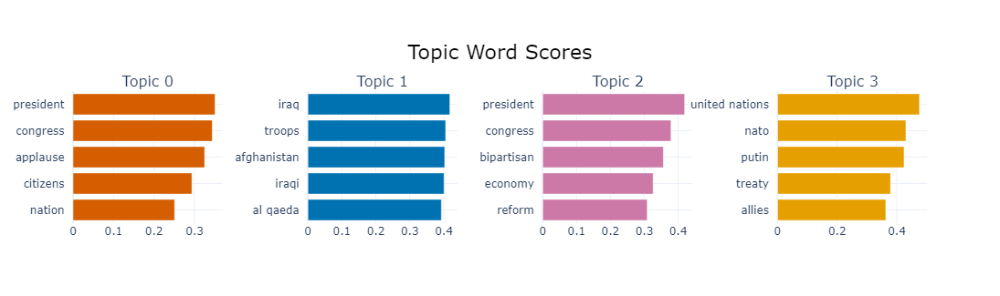

In [68]:
topic_model.visualize_barchart()


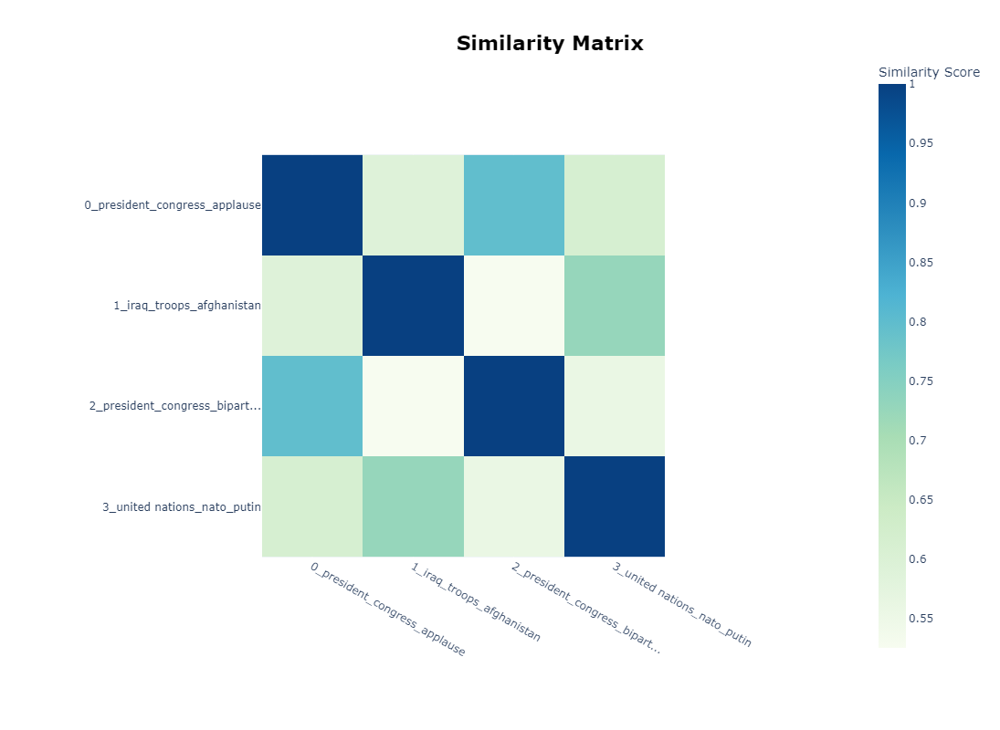

In [69]:
topic_model.visualize_heatmap()


44it [01:07,  1.53s/it]


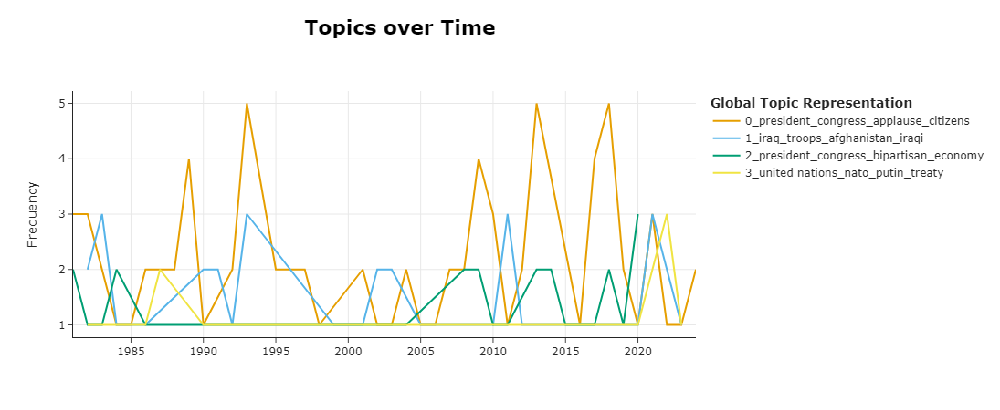

In [70]:
topics_over_time = topic_model.topics_over_time(speeches, years)
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1, 2, 3,4,5,6])


8it [00:21,  2.71s/it]


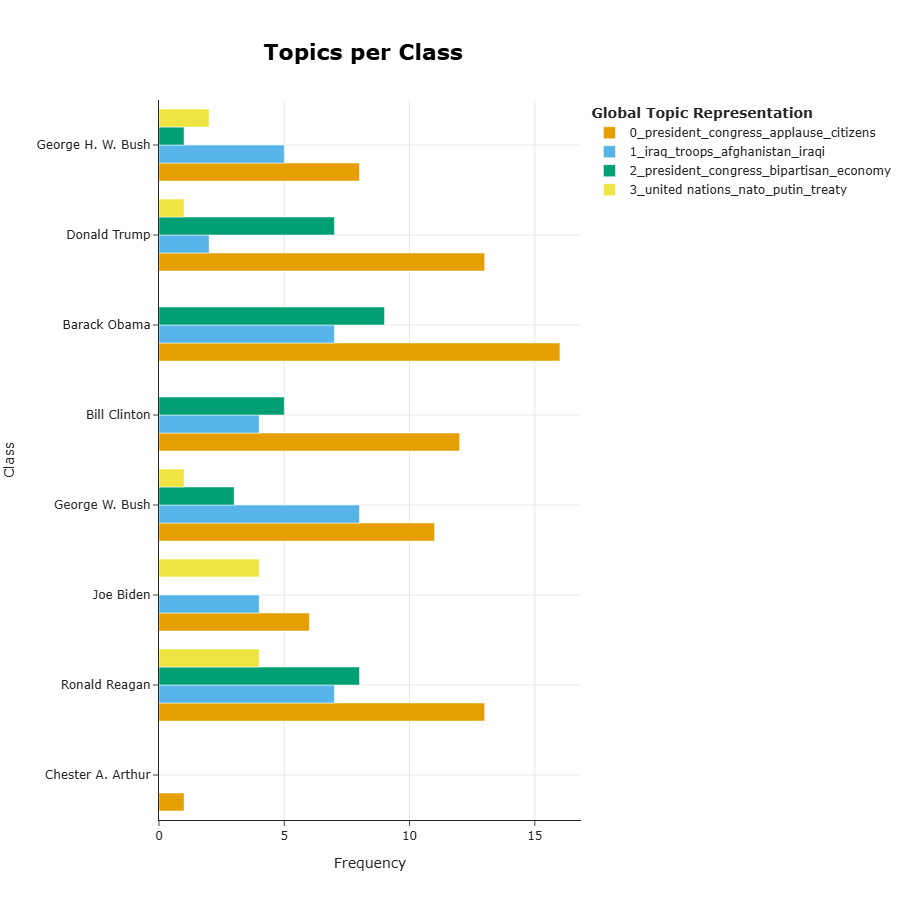

In [71]:

topics_per_class = topic_model.topics_per_class(speeches, classes = classes)
topic_model.visualize_topics_per_class(topics_per_class)



In [72]:

topic_distr, _ = topic_model.approximate_distribution(speeches, min_similarity=0)

# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(speeches, calculate_tokens=True)

# Visualize the token-level distributions
tld = topic_model.visualize_approximate_distribution(speeches[1], topic_token_distr[1])
tld

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:27<00:00, 27.91s/it]


,Hello,everybody,Well,thank,you,very,much,And,good,afternoon,As,President,my,highest,and,most,solemn,duty,is,the,defense,of,our,nation,and,its,citizens,Last,night,at,my,direction,the,United,States,military,successfully,executed,flawless,precision,strike,that,killed,the,number,one,terrorist,anywhere,in,the,world,Qasem,Soleimani,Soleimani,was,plotting,imminent,and,sinister,attacks,on,American,diplomats,and,military,personnel,but,we,caught,him,in,the,act,and,terminated,him,Under,my,leadership,America,policy,is,unambiguous,To,terrorists,who,harm,or,intend,to,harm,any,American,we,will,find,you,we,will,eliminate,you,We,will,always,protect,our,diplomats,service,members,all,Americans,and,our,allies,For,years,the,Islamic,Revolutionary,Guard,Corps,and,its,ruthless,Quds,Force,under,Soleimani,leadership,has,targeted,injured,and,murdered,hundreds,of,American,civilians,and,servicemen,The,recent,attacks,on,US,targets,in,Iraq,including,rocket,strikes,that,killed,an,American,and,injured,four,American,servicemen,very,badly,as,well,as,violent,assault,on,our,embassy,in,Baghdad,were,carried,out,at,the,direction,of,Soleimani,Soleimani,made,the,death,of,innocent,people,his,sick,passion,contributing,to,terrorist,plots,as,far,away,as,New,Delhi,and,London,Today,we,remember,and,honor,the,victims,of,Soleimani,many,atrocities,and,we,take,comfort,in,knowing,that,his,reign,of,terror,is,over,Soleimani,has,been,perpetrating,acts,of,terror,to,destabilize,the,Middle,East,for,the,last,20,years,What,the,United,States,did,yesterday,should,have,been,done,long,ago,lot,of,lives,would,have,been,saved,Just,recently,Soleimani,led,the,brutal,repression,of,protestors,in,Iran,where,more,than,thousand,innocent,civilians,were,tortured,and,killed,by,their,own,government,We,took,action,last,night,to,stop,war,We,did,not,take,action,to,start,war,have,deep,respect,for,the,Iranian,people,They,are,remarkable,people,with,an,incredible,heritage,and,unlimited,potential,We,do,not,seek,regime,change,However,the,Iranian,regime,aggression,in,the,region,including,the,use,of,proxy,fighters,to,destabilize,its,neighbors,must,end,and,it,must,end,now,The,future,belongs,to,the,people,of,Iran,those,who,seek,peaceful,coexistence,and,cooperation,not,the,terrorist,warlords,who,plunder,their,nation,to,finance,bloodshed,abroad,The,United,States,has,the,best,military,by,far,anywhere,in,the,world,We,have,best,intelligence,in,the,world,If,Americans,anywhere,are,threatened,we,have,all,of,those,targets,already,fully,identified,and,am,ready,and,prepared,to,take,whatever,action,is,necessary,And,that,in,particular,refers,to,Iran,Under,my,leadership,we,have,destroyed,the,ISIS,territorial,caliphate,and,recently,American,Special,Operations,Forces,killed,the,terrorist,leader,known,as,al,Baghdadi,The,world,is,safer,place,without,these,monsters,America,will,always,pursue,the,interests,of,good


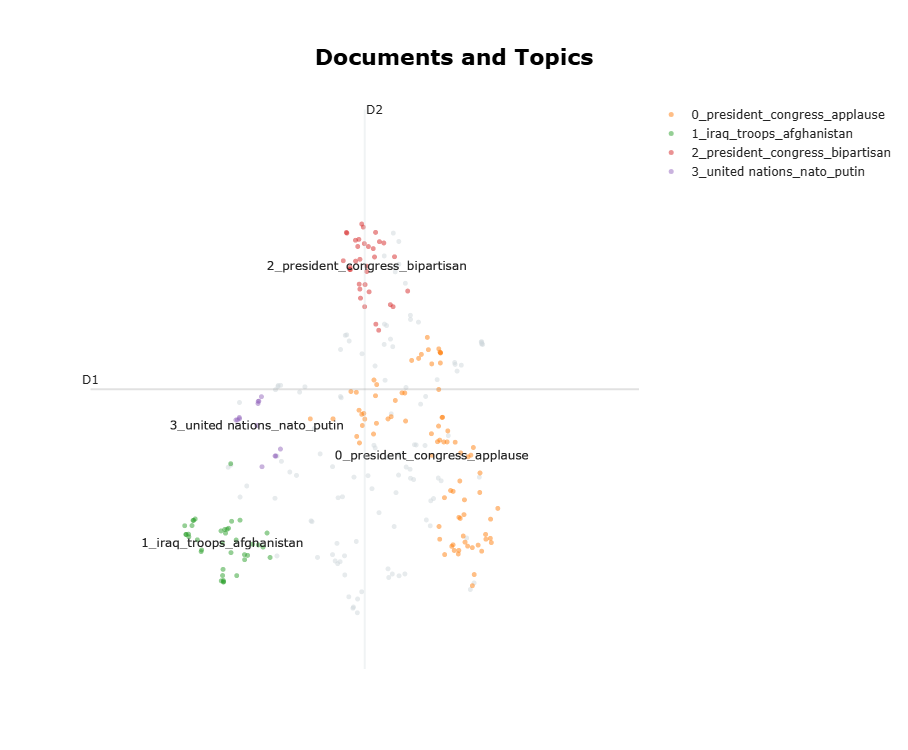

In [73]:
topic_model.visualize_documents(speeches, embeddings=embeddings)



In [74]:
>>> topic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,-1,110,-1_congress_president_progress_citizens,"[congress, president, progress, citizens, unio...","[Mr. President, Mr. Speaker, members of the 10..."
1,0,80,0_president_congress_applause_citizens,"[president, congress, applause, citizens, nati...","[Good evening. Good evening. If I were smart, ..."
2,1,37,1_iraq_troops_afghanistan_iraqi,"[iraq, troops, afghanistan, iraqi, al qaeda, i...","[Good evening. Tonight in Iraq, the Armed Forc..."
3,2,33,2_president_congress_bipartisan_economy,"[president, congress, bipartisan, economy, ref...","[Mr. Speaker, Mr. Vice President, members of C..."
4,3,12,3_united nations_nato_putin_treaty,"[united nations, nato, putin, treaty, allies, ...","[Mr. President, thank you very much. Mr. Secre..."


In [75]:
topic_model.get_document_info(speeches)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,As long as I am President of the United States...,3,3_united nations_nato_putin_treaty,"[united nations, nato, putin, treaty, allies, ...","[Mr. President, thank you very much. Mr. Secre...",united nations - nato - putin - treaty - allie...,1.000000,False
1,"Hello, everybody. Well, thank you very much. ...",1,1_iraq_troops_afghanistan_iraqi,"[iraq, troops, afghanistan, iraqi, al qaeda, i...","[Good evening. Tonight in Iraq, the Armed Forc...",iraq - troops - afghanistan - iraqi - al qaeda...,0.986658,False
2,"Last night, the United States brought the worl...",1,1_iraq_troops_afghanistan_iraqi,"[iraq, troops, afghanistan, iraqi, al qaeda, i...","[Good evening. Tonight in Iraq, the Armed Forc...",iraq - troops - afghanistan - iraqi - al qaeda...,1.000000,False
3,PRESIDENT TRUMP: Thank you very much. Thank...,-1,-1_congress_president_progress_citizens,"[congress, president, progress, citizens, unio...","[Mr. President, Mr. Speaker, members of the 10...",congress - president - progress - citizens - u...,0.000000,False
4,PRESIDENT TRUMP: Thank you very much. Mr. P...,0,0_president_congress_applause_citizens,"[president, congress, applause, citizens, nati...","[Good evening. Good evening. If I were smart, ...",president - congress - applause - citizens - n...,0.924353,False
...,...,...,...,...,...,...,...,...
267,"Chairwoman Margaret Bush Wilson, I thank you v...",0,0_president_congress_applause_citizens,"[president, congress, applause, citizens, nati...","[Good evening. Good evening. If I were smart, ...",president - congress - applause - citizens - n...,1.000000,False
268,"Father Hesburgh, I thank you very much and for...",-1,-1_congress_president_progress_citizens,"[congress, president, progress, citizens, unio...","[Mr. President, Mr. Speaker, members of the 10...",congress - president - progress - citizens - u...,0.000000,False
269,"Mr. Speaker, Mr. President, distinguished Memb...",-1,-1_congress_president_progress_citizens,"[congress, president, progress, citizens, unio...","[Mr. President, Mr. Speaker, members of the 10...",congress - president - progress - citizens - u...,0.000000,False
270,The President: How do you do? I have a brief o...,2,2_president_congress_bipartisan_economy,"[president, congress, bipartisan, economy, ref...","[Mr. Speaker, Mr. Vice President, members of C...",president - congress - bipartisan - economy - ...,0.911841,False
